In [432]:
#!pip install beautifulsoup4

## Código do Kaggle

In [433]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tweets-covid-ptbr/tweets (1).csv
/kaggle/input/covid-19-nlp-text-classification-portuguese/Corona_NLP_test.csv
/kaggle/input/covid-19-nlp-text-classification-portuguese/Corona_NLP_train.csv
/kaggle/input/corona-virus/twitter.png
/kaggle/input/corona-virus/coronav.jpg


## Bibliotecas

In [434]:
import nltk, re, keras

from nltk.corpus import stopwords
from wordcloud import WordCloud
from bs4 import BeautifulSoup
from keras.preprocessing import text
from keras.models import Sequential
from keras.utils import to_categorical
from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

## Carregar Datasets

In [435]:
train_data = pd.read_csv('/kaggle/input/covid-19-nlp-text-classification-portuguese/Corona_NLP_train.csv',encoding='latin_1',sep=';')
test_data = pd.read_csv("/kaggle/input/covid-19-nlp-text-classification-portuguese/Corona_NLP_test.csv",encoding='latin_1',sep=';')
final_data = pd.read_csv('/kaggle/input/tweets-covid-ptbr/tweets (1).csv', sep=';')

In [436]:
train_data.head()

,OriginalTweet,Sentiment
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutro
1,conselho Fale com a família de seus vizinhos p...,Positivo
2,Coronavirus Australia: Woolworths dará a idoso...,Positivo
3,Meu estoque de alimentos não é o único que est...,Positivo
4,Eu pronto para ir ao supermercado durante o s...,Extremamente Negativo


In [437]:
test_data.head()

,OriginalTweet,Sentiment
0,TENDÊNCIAS: os nova-iorquinos encontram pratel...,Extremamente Negativo
1,Quando não consegui encontrar desinfetante par...,Positivo
2,Descubra como você pode proteger a si mesmo e ...,Extremamente Positivo
3,A compra #Panic atinge a #NewYork City enquant...,Negativo
4,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutro


In [438]:
final_data.head()

,tweet
0,Se esse governo não está preocupado com a mort...
1,"Rapaz esse cara precisa sair logo do governo ,..."
2,Covid-19 fez crescer o racismo em Odemira cont...
3,Covid-19 fez crescer o racismo em Odemira cont...
4,"Levy Fidelix, presidente do PRTB, morre em dec..."


## Excluir duplicatas e nulos

In [439]:
train_data.drop_duplicates(inplace= True)
test_data.drop_duplicates(inplace=True)
final_data.drop_duplicates(inplace=True)

In [440]:
train_data.dropna(inplace=True)
test_data.dropna(inplace=True)
final_data.dropna(inplace=True)

## Salvando uma cópia do dataset

In [441]:
train_df = train_data.copy()
test_df = test_data.copy()
final_df = final_data.copy()

## Gerar gráficos de Sentimentos

In [442]:
sns.set_style("whitegrid")
sns.set(rc={'figure.figsize':(11,4)})

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Sentiment', ylabel='count'>

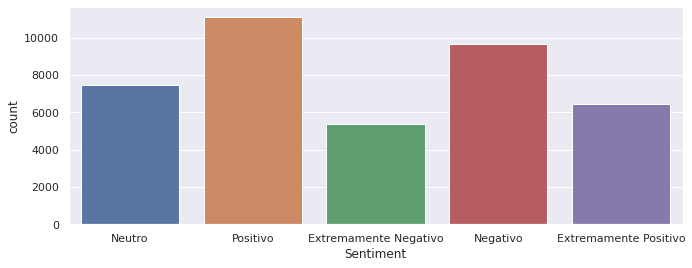

In [443]:
sns.countplot(train_df['Sentiment'])

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Sentiment', ylabel='count'>

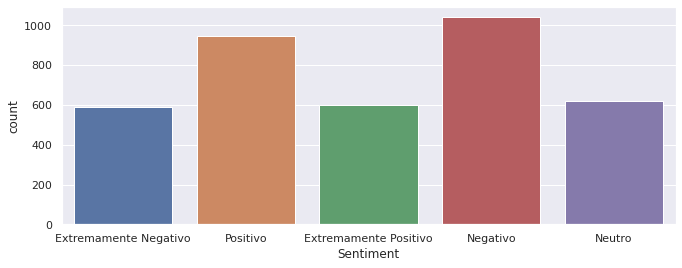

In [444]:
sns.countplot(test_df['Sentiment'])

In [445]:
train_df.shape, test_df.shape

((40105, 2), (3798, 2))

## Função para agrupar os dados apenas em positivos, negativos e neutros

In [446]:
def change_sen(sentiment):
    if sentiment == "Extremamente Positivo":
        return 'positivo'
    elif sentiment == "Extremamente Negativo":
        return 'negativo'
    elif sentiment == "Positivo":
        return 'positivo'
    elif sentiment == "Negativo":
        return 'negativo'
    else:
        return 'neutro'

### Aplicando a função nos dados de treinamento e teste 

In [447]:
train_df['Sentiment'] = train_df['Sentiment'].apply(lambda x: change_sen(x))
test_df['Sentiment'] = test_df['Sentiment'].apply(lambda x: change_sen(x))

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Sentiment', ylabel='count'>

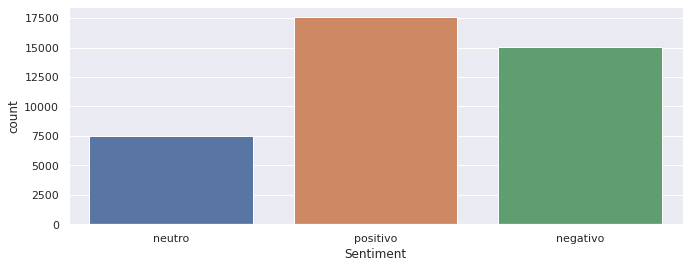

In [448]:
sns.countplot(train_df['Sentiment'])

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Sentiment', ylabel='count'>

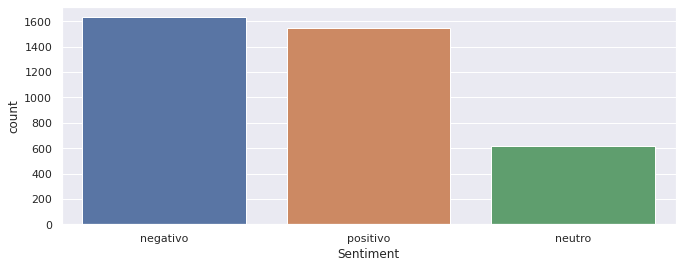

In [449]:
sns.countplot(test_df['Sentiment'])

## Limpeza e processamento dos dados 

In [450]:
stop_word = stopwords.words('portuguese')
complemento = ['a', 'agora', 'ai', 'aí', 'ainda', 'alguém', 'algum', 'alguma', 'algumas', 'alguns', 'ampla', 
               'amplas', 'amplo', 'amplos', 'ante', 'antes', 'ao', 'aos', 'após', 'aquela', 'aquelas', 
               'aquele', 'aqueles', 'aquilo', 'as', 'até', 'através', 'cada', 'coisa', 'coisas', 'com', 
               'como', 'contra', 'contudo', 'da', 'daquele', 'daqueles', 'das', 'de', 'dela', 'delas', 
               'dele', 'deles', 'depois', 'dessa', 'dessas', 'desse', 'desses', 'desta', 'destas', 
               'deste', 'deste', 'destes', 'deve', 'devem', 'devendo', 'dever', 'deverá', 'deverão', 
               'deveria', 'deveriam', 'devia', 'deviam','dia', 'disse', 'disso', 'disto', 'dito', 'diz', 
               'dizem', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'enquanto', 'entre', 
               'era', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 
               'estava', 'estavam', 'estávamos', 'este', 'estes', 'estou', 'eu', 'fazendo', 'fazer', 
               'feita', 'feitas', 'feito', 'feitos', 'foi', 'for', 'foram', 'fosse', 'fossem', 'grande', 
               'grandes', 'há', 'hoje', 'ir', 'isso', 'isto', 'já', 'la', 'lá', 'lhe', 'lhes', 'lo', 'mas', 'me', 
               'mesma', 'mesmas', 'mesmo', 'mesmos', 'meu', 'meus', 'minha', 'minhas', 'muita', 'muitas', 
               'muito', 'muitos', 'na', 'não', 'nas', 'nem', 'nenhum', 'nessa', 'nessas', 'nesta', 
               'nestas', 'ninguém', 'no', 'nos', 'nós', 'nossa', 'nossas', 'nosso', 'nossos', 'num', 
               'numa', 'nunca', 'o', 'os', 'ou', 'outra', 'outras', 'outro', 'outros', 'para', 'pela', 
               'pelas', 'pelo', 'pelos', 'pequena', 'pequenas', 'pequeno', 'pequenos', 'per', 'perante', 
               'pessoa','pode', 'pude', 'podendo', 'poder', 'poderia', 'poderiam', 'podia', 'podiam', 'pois', 
               'por', 'porém', 'porque', 'posso', 'pouca', 'poucas', 'pouco', 'poucos', 'pra', 'primeiro', 
               'primeiros', 'própria', 'próprias', 'próprio', 'próprios', 'quais', 'qual', 'quando', 
               'quanto', 'quantos', 'que', 'quem', 'são', 'se', 'seja', 'sejam', 'sem', 'sempre', 'sendo', 
               'será', 'serão', 'seu', 'seus', 'si', 'sido', 'só', 'sob', 'sobre', 'sua', 'suas', 'talvez', 
               'também', 'tampouco', 'te', 'tem', 'tendo', 'tenha', 'ter', 'teu', 'teus', 'ti', 'tido', 
               'tinha', 'tinham', 'toda', 'todas', 'todavia', 'todo', 'todos', 'tu', 'tua', 'tuas', 'tudo', 
               'última', 'últimas', 'último', 'últimos', 'um', 'uma', 'umas', 'uns', 'vai', 'vendo', 'ver', 'vez', 
               'vindo', 'vir', 'vos', 'vós']

stop_word.extend(complemento)

internet = ['aff', 'add', 'amg', 'n', 's', 'ss', 'nn', 'pq', 'sqn', 'cmg', 'ctz', 'msg', 'msm', 'pfv', 'plmdds'
           'sdds', 'vdd', 'agr', 'fds', 'aql', 'fzd', 'p', 'q', 'h', 'k']

stop_word.extend(internet)

In [451]:
print(stop_word)

['de', 'a', 'o', 'que', 'e', 'é', 'do', 'da', 'em', 'um', 'para', 'com', 'não', 'uma', 'os', 'no', 'se', 'na', 'por', 'mais', 'as', 'dos', 'como', 'mas', 'ao', 'ele', 'das', 'à', 'seu', 'sua', 'ou', 'quando', 'muito', 'nos', 'já', 'eu', 'também', 'só', 'pelo', 'pela', 'até', 'isso', 'ela', 'entre', 'depois', 'sem', 'mesmo', 'aos', 'seus', 'quem', 'nas', 'me', 'esse', 'eles', 'você', 'essa', 'num', 'nem', 'suas', 'meu', 'às', 'minha', 'numa', 'pelos', 'elas', 'qual', 'nós', 'lhe', 'deles', 'essas', 'esses', 'pelas', 'este', 'dele', 'tu', 'te', 'vocês', 'vos', 'lhes', 'meus', 'minhas', 'teu', 'tua', 'teus', 'tuas', 'nosso', 'nossa', 'nossos', 'nossas', 'dela', 'delas', 'esta', 'estes', 'estas', 'aquele', 'aquela', 'aqueles', 'aquelas', 'isto', 'aquilo', 'estou', 'está', 'estamos', 'estão', 'estive', 'esteve', 'estivemos', 'estiveram', 'estava', 'estávamos', 'estavam', 'estivera', 'estivéramos', 'esteja', 'estejamos', 'estejam', 'estivesse', 'estivéssemos', 'estivessem', 'estiver', 'estiv

### Função para limpeza de dados

In [452]:
def clean(text):

    #     remove urls
    text = re.sub(r'http\S+', " ", text)

    #     remove mentions
    text = re.sub(r'@\w+',' ',text)

    #     remove hastags
    text = re.sub(r'#\w+', ' ', text)

    #     remove digits
    text = re.sub(r'\d+', ' ', text)

    #     remove html tags
    text = re.sub('r<.*?>',' ', text)
    
    #     remove stop words 
    text = text.split()
    text = " ".join([word for word in text if not word in stop_word])
    
      
    return text

In [453]:
train_df['OriginalTweet'] = train_df['OriginalTweet'].apply(lambda x: clean(x))
test_df['OriginalTweet'] = test_df['OriginalTweet'].apply(lambda x: clean(x))

In [454]:
train_df.head()

,OriginalTweet,Sentiment
0,,neutro
1,conselho Fale família vizinhos trocar números ...,positivo
2,Coronavirus Australia: Woolworths dará idosos ...,positivo
3,Meu estoque alimentos único vazio ... POR FAVO...,positivo
4,Eu pronto supermercado durante surto # COVID ....,negativo


In [455]:
df_train = train_df
df_test = test_df

In [456]:
df_train.head()

,OriginalTweet,Sentiment
0,,neutro
1,conselho Fale família vizinhos trocar números ...,positivo
2,Coronavirus Australia: Woolworths dará idosos ...,positivo
3,Meu estoque alimentos único vazio ... POR FAVO...,positivo
4,Eu pronto supermercado durante surto # COVID ....,negativo


### Mapeando sentimentos
- 0: Neutro 
- 1: Positivo
- 2: Negativo

In [457]:
l = {"neutro":0, "positivo":1,"negativo":2}

In [458]:
df_train['Sentiment'] = df_train['Sentiment'].map(l)
df_test['Sentiment']  = df_test['Sentiment'].map(l)

In [459]:
df_train.head()

,OriginalTweet,Sentiment
0,,0
1,conselho Fale família vizinhos trocar números ...,1
2,Coronavirus Australia: Woolworths dará idosos ...,1
3,Meu estoque alimentos único vazio ... POR FAVO...,1
4,Eu pronto supermercado durante surto # COVID ....,2


In [460]:
x_train = df_train['OriginalTweet'].copy()
x_test = df_test['OriginalTweet'].copy()

y_train = df_train['Sentiment'].copy()
y_test = df_test['Sentiment'].copy()

In [461]:
x_train.shape, y_train.shape,x_test.shape, y_test.shape

((40105,), (40105,), (3798,), (3798,))

#### Tamanho máximo da sequência 

In [462]:
max_len = np.max(x_train.apply(lambda x :len(x)))

In [463]:
max_len

353

### Início da tokenização

In [464]:
tokenizer = Tokenizer()

In [465]:
tokenizer.fit_on_texts(x_train)
vocab_length = len(tokenizer.word_index) + 1

x_train = tokenizer.texts_to_sequences(x_train)
x_test = tokenizer.texts_to_sequences(x_test)

x_train = pad_sequences(x_train, maxlen=max_len, padding='post')
x_test = pad_sequences(x_test, maxlen=max_len, padding='post')

In [466]:
print("Vocab length:", vocab_length)
print("Max sequence length:", max_len)

Vocab length: 42622
Max sequence length: 353


In [467]:
embedding_dim = 16

## Criação do modelo

In [468]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_length, embedding_dim, input_length=max_len),
    tf.keras.layers.Bidirectional(tf.keras.layers.GRU(128, return_sequences=True)),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(3, activation='softmax')
])

model.compile(loss='categorical_crossentropy',optimizer="adam",metrics=['accuracy'])

In [469]:
print(model.summary())

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_9 (Embedding)      (None, 353, 16)           681952    
_________________________________________________________________
bidirectional_9 (Bidirection (None, 353, 256)          112128    
_________________________________________________________________
global_average_pooling1d_9 ( (None, 256)               0         
_________________________________________________________________
dense_18 (Dense)             (None, 8)                 2056      
_________________________________________________________________
dropout_9 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_19 (Dense)             (None, 3)                 27        
Total params: 796,163
Trainable params: 796,163
Non-trainable params: 0
________________________________________________

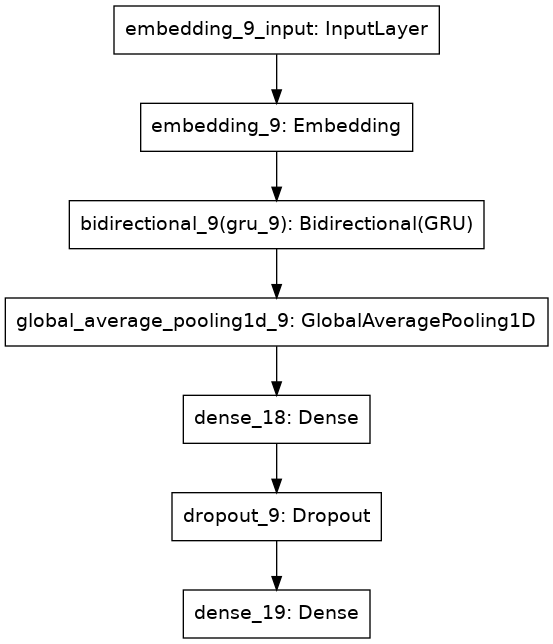

In [470]:
tf.keras.utils.plot_model(model)

In [471]:
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((40105, 353), (3798, 353), (40105,), (3798,))

In [472]:
y_train = to_categorical(y_train, 3)
y_test = to_categorical(y_test, 3)

## Treinando o modelo

In [473]:
num_epochs = 10
history = model.fit(x_train, y_train, epochs=num_epochs, 
                    validation_data=(x_test, y_test))

Epoch 1/10
1254/1254 [==============================] - 48s 37ms/step - loss: 1.0508 - accuracy: 0.4303 - val_loss: 0.8334 - val_accuracy: 0.6243
Epoch 2/10
1254/1254 [==============================] - 45s 36ms/step - loss: 0.7770 - accuracy: 0.6798 - val_loss: 0.6966 - val_accuracy: 0.7098
Epoch 3/10
1254/1254 [==============================] - 45s 36ms/step - loss: 0.5892 - accuracy: 0.7708 - val_loss: 0.6894 - val_accuracy: 0.7309
Epoch 4/10
1254/1254 [==============================] - 45s 36ms/step - loss: 0.4891 - accuracy: 0.8114 - val_loss: 0.7313 - val_accuracy: 0.7328
Epoch 5/10
1254/1254 [==============================] - 45s 36ms/step - loss: 0.4081 - accuracy: 0.8369 - val_loss: 0.8143 - val_accuracy: 0.7254
Epoch 6/10
1254/1254 [==============================] - 45s 36ms/step - loss: 0.3461 - accuracy: 0.8720 - val_loss: 0.9135 - val_accuracy: 0.7204
Epoch 7/10
1254/1254 [==============================] - 45s 36ms/step - loss: 0.3026 - accuracy: 0.8849 - val_loss: 0.9338 -

In [474]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

## Acurácia

In [475]:
print(f"Accuracy on training data is:- {acc[-1]*100} %")

print(f"Accuracy on validation data is:- {val_acc[-1]*100} %")

Accuracy on training data is:- 91.17815494537354 %
Accuracy on validation data is:- 70.64244151115417 %


## Classificando novos dados 

In [476]:
final_df['tweet'] = final_df['tweet'].apply(lambda x: clean(x))
df_final = final_df
x_final = df_final['tweet'].copy()

x_final = tokenizer.texts_to_sequences(x_final)
x_final = pad_sequences(x_final, maxlen=max_len, padding='post')
y_final = model.predict_classes(x_final)

/opt/conda/lib/python3.7/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

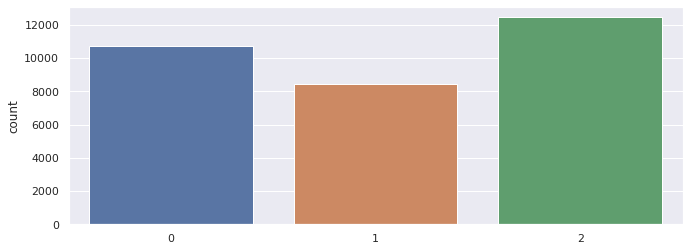

In [477]:
df_final['Sentiment'] = y_final
sns.countplot(y_final)

In [478]:
twitter_mask = np.array(Image.open("/kaggle/input/corona-virus/twitter.png"))
neg = " ".join(sentiment for sentiment in df_final[df_final["Sentiment"]==2].tweet)
pos = " ".join(sentiment for sentiment in df_final[df_final["Sentiment"]==1].tweet)

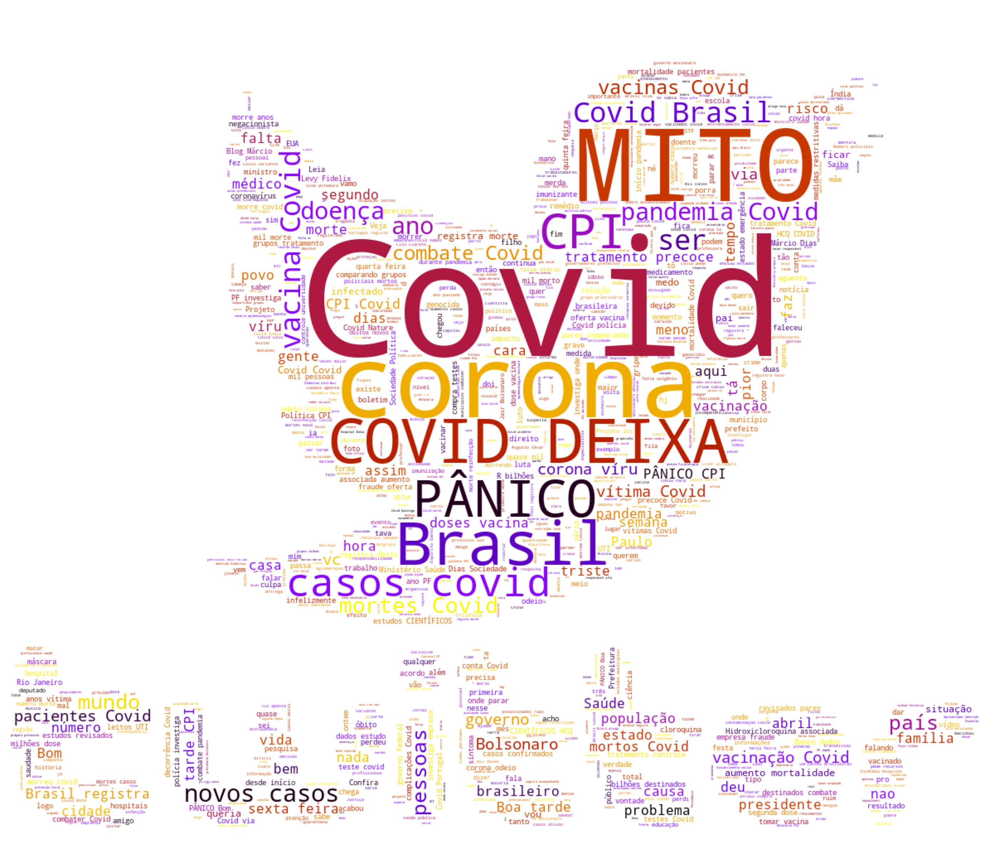

In [479]:
wordcloud = WordCloud(stopwords=stop_word,
                      background_color="white",
                      width=1000, height=1000, max_words=1000,
                      mask=twitter_mask, max_font_size=200,
                      min_font_size=1, colormap='gnuplot').generate(neg)
 

fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()
 
plt.imshow(wordcloud)

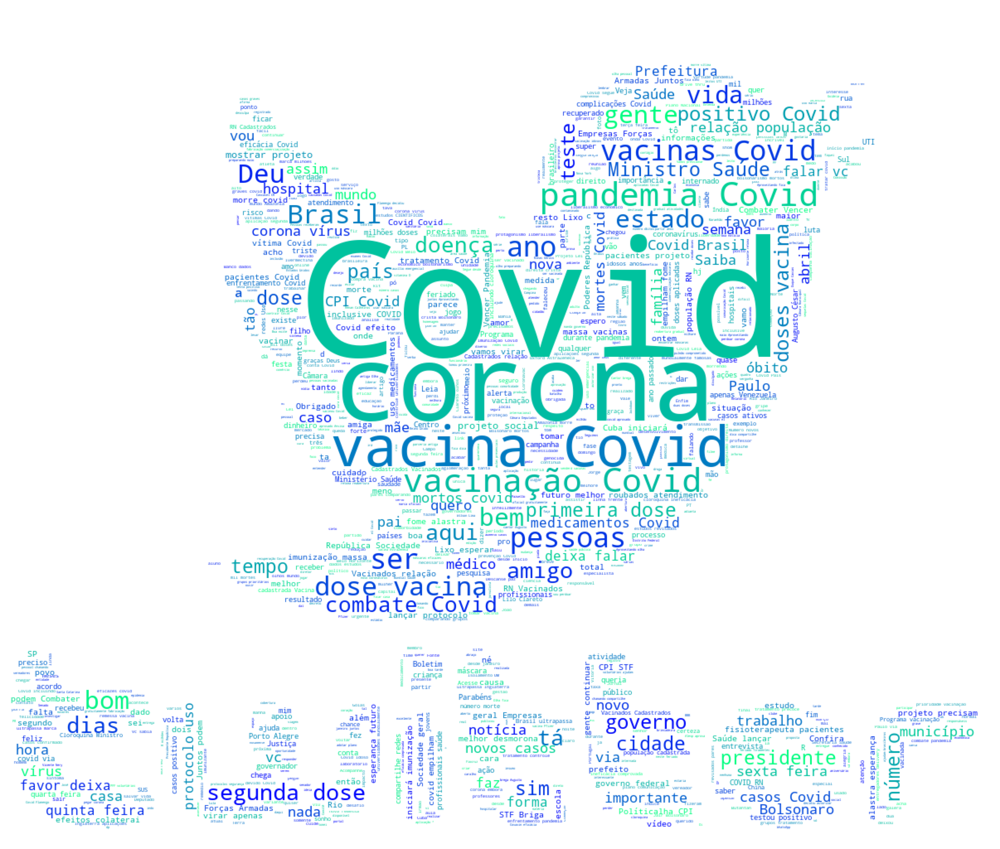

In [480]:
wordcloud = WordCloud(stopwords=stop_word,
                      background_color="white",
                      width=1000, height=1000, max_words=1000,
                      mask=twitter_mask, max_font_size=200,
                      min_font_size=1, colormap='winter').generate(pos)
 

fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()
 
plt.imshow(wordcloud)

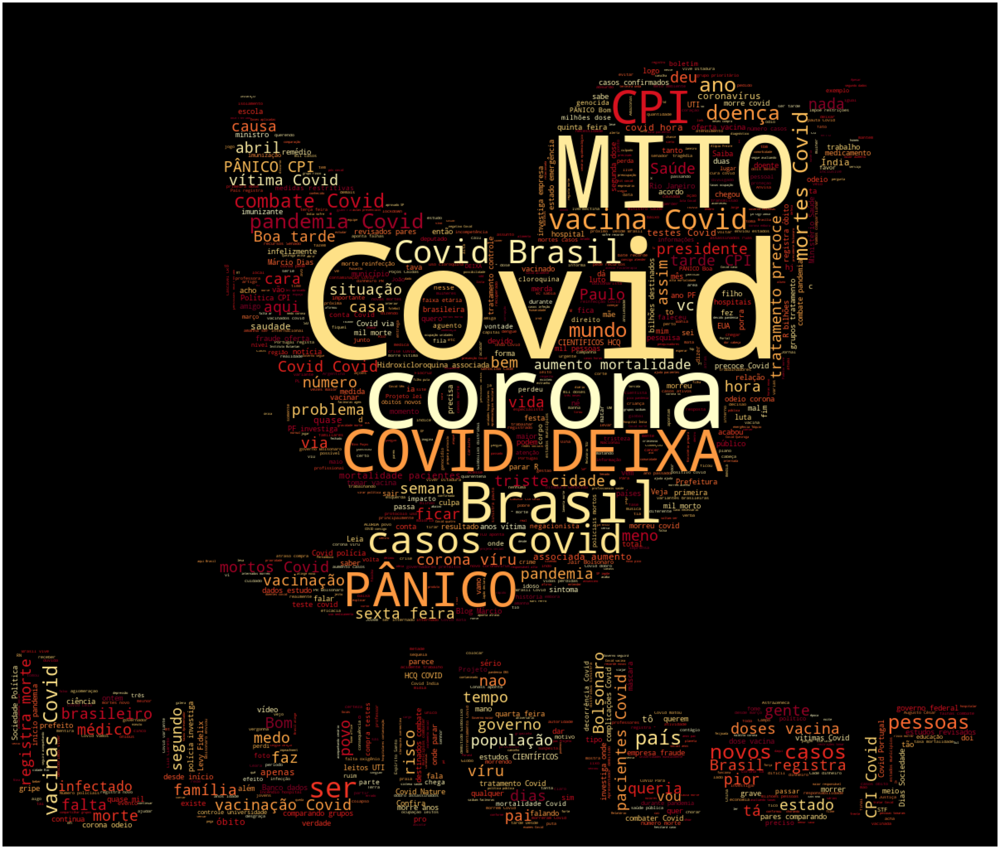

In [481]:
wordcloud = WordCloud(stopwords=stop_word,
                      background_color="black",
                      width=1000, height=1000, max_words=1000,
                      mask=twitter_mask, max_font_size=200,
                      min_font_size=1, colormap='YlOrRd').generate(neg)
 

fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()
 
plt.imshow(wordcloud)

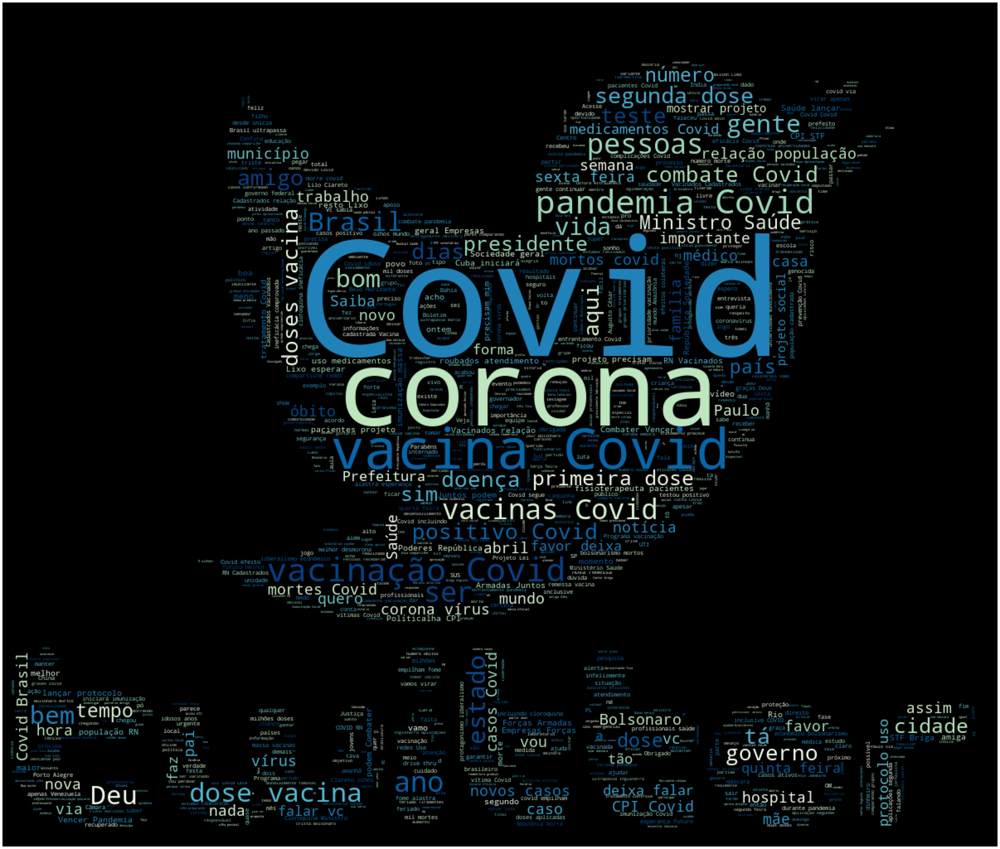

In [482]:
wordcloud = WordCloud(stopwords=stop_word,
                      background_color="black",
                      width=1000, height=1000, max_words=1000,
                      mask=twitter_mask, max_font_size=200,
                      min_font_size=1, colormap='GnBu').generate(pos)
 

fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()
 
plt.imshow(wordcloud)